# PROJETO DE PDI
# GRUPO: YAN BORGES, VLADIMIR YURI, VÍTOR ZIMBRUNES, JOÃO NETO E THIAGO VANNUCCI

## IMPORTAÇÃO DE BIBLIOTECAS

In [37]:
from PIL import Image
import matplotlib.image as mat_im
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.tri as tri
import math

## CRIAÇÃO DAS FUNÇÕES PARA ABRIR, SALVAR E MANIPULAR UM ARQUIVO

In [2]:
#FUNÇÃO PARA ABRIR E EXIBIR
def open_image(img):
  image = Image.open(img)
  return image

#FUNÇÃO PARA SALVAR
def save_image(img, name, ext):
  image = img.save(f"{name}.{ext}")
  return image

#FUNÇÃO PARA VISUALIZAR DIMENSÕES
def dim_image(img):
  RGB = mat_im.imread(img)
  shape_img = RGB.shape
  print(f'PIXELS: {shape_img[0]}x{shape_img[1]}\nCANAIS DE CORES: {shape_img[2]}')

# QUESTÃO 01

In [3]:
#FUNÇÃO PARA TRANSFORMAR SISTEMAS
def RGB_to_HSB(img):
  #RECUPERA A MATRIZ DE PIXELS
  RGB = mat_im.imread(img)
  #m = linhas, n = colunas
  m,n = RGB.shape[0], RGB.shape[1]

  #Aloca as respectivas cores nos vetores apropriados
  R = np.array([RGB[i][j][0] for j in range(n) for i in range(m)]) #RED
  G = np.array([RGB[i][j][1] for j in range(n) for i in range(m)]) #GREEN
  B = np.array([RGB[i][j][2] for j in range(n) for i in range(m)]) #BLUE

  R = R/255.0
  G = G/255.0
  B = B/255.0

  H = []
  S = []
  V = []

  for i in range(len(R)):
    min_value = min(R[i], G[i], B[i])

    max_array = np.array([R[i], G[i], B[i]])
    max_value = max_array.max()

    if(max_value == min_value):
      H.append('Matiz Indefinida')

    elif(max_value == max_array[0] and G[i] >= B[i]): #A posição 0 indica R
      H.append(round((60 * ((G[i]-B[i])/(max_value-min_value)) + 0),2))

    elif(max_value == max_array[0] and G[i] < B[i]):
      H.append(round((60 * ((G[i]-B[i])/(max_value-min_value)) + 360),2))

    elif(max_value == max_array[1]):
      H.append(round((60 * ((B[i]-R[i])/(max_value-min_value)) + 120),2))

    elif(max_value == max_array[2]):
      H.append(round((60 * ((G[i]-B[i])/(max_value-min_value)) + 240),2))

    if(max_value == 0):
      S.append(0)
    elif(max_value != 0):
      S.append(round((1 - (min_value/max_value)),2))

    V.append(max_value)

  HSB = [[H[i], S[i], V[i]] for i in range(len(H))]

  return HSB

def HSB_to_RGB(data):
  H = data['H'].values
  S = data['S'].values
  V = data['B'].values

  r = []
  g = []
  b = []

  R = 0
  G = 0
  B = 0

  for i in range(len(H)):
    if(S[i] == 0):
      R = G = B = V[i]
    else:
      Sec_Pos = H[i]/60
      Sec_Number = int(math.floor(Sec_Pos))

      Sec_Frac = Sec_Pos - Sec_Number

      p = V[i]*(1.0 - S[i])
      q = V[i]*(1.0 - (S[i]*Sec_Frac))
      t = V[i]*(1.0 - (S[i]*(1 - Sec_Frac)))

      if(Sec_Number == 0):
        R = V[i]
        G = t
        B = p
      elif(Sec_Number == 1):
        R = q
        G = V[i]
        B = p
      elif(Sec_Number == 2):
        R = p
        G = V[i]
        B = t
      elif(Sec_Number == 3):
        R = p
        G = q
        B = V[i]
      elif(Sec_Number == 4):
        R = t
        G = p
        B = V[i]
      elif(Sec_Number == 5):
        R = V[i]
        G = p
        B = q

    r.append(R)
    g.append(G)
    b.append(B)

  RGB = [[r[i], g[i], b[i]] for i in range(len(H))]

  return RGB

#FUNÇÃO PARA MODIFICAR
#def mod_image(img)

## TESTE COM IMAGEM

In [4]:
#Aqui, copie o caminho da imagem escolhida
img = "F:/Programação/PDI/DancingInWater.jpg"

In [5]:
#Abre a imagem
new_image = open_image(img)

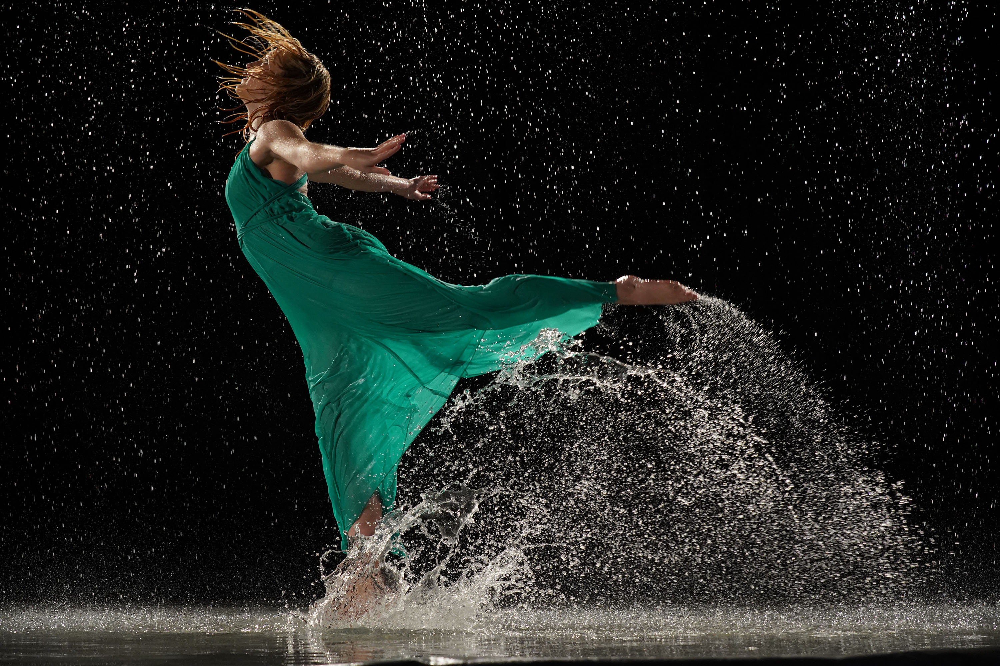

In [6]:
new_image

In [8]:
#Salva a imagem
name = str(input("Informe um nome para a imagem: "))
ext = str(input("Informe a extensão da imagem: "))

saved_image = save_image(new_image, name, ext)

Informe um nome para a imagem:  teste
Informe a extensão da imagem:  png


## 2-) CONVERSÃO RGB-HSB-RGB

## VISUALIZAÇÃO DE DIMENSÃO

In [9]:
path = 'F:/Programação/PDI/teste.jpg'

In [10]:
dim_image(path)

PIXELS: 2000x3000
CANAIS DE CORES: 3


## CONVERTE A IMAGEM PARA HSB

In [11]:
HSB = RGB_to_HSB(path)

In [12]:
HSB = pd.DataFrame(HSB)
HSB.columns = ['H', 'S', 'B']

In [13]:
HSB

,H,S,B
0,Matiz Indefinida,0.00,0.003922
1,Matiz Indefinida,0.00,0.003922
2,Matiz Indefinida,0.00,0.003922
3,Matiz Indefinida,0.00,0.003922
4,Matiz Indefinida,0.00,0.003922
...,...,...,...
5999995,180.0,0.29,0.027451
5999996,180.0,0.29,0.027451
5999997,180.0,0.25,0.031373
5999998,180.0,0.25,0.031373


## CONVERTE A IMAGEM PARA RGB

In [14]:
RGB = HSB_to_RGB(HSB)

In [15]:
RGB

[[0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.00392156862745098, 0.00392156862745098, 0.00392156862745098],
 [0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0],
 [0.0196078431372549, 0.0196078431372549, 0.0196078431372549],
 [0.011764705882352941, 0.011764705882352941, 0.011764705882352941],
 [0.0, 0.0, 0.0],
 [0.011764705882352941, 0.011764705882352941, 0.011764705882352941],
 [0.0196078431372549, 0.0196078431372549, 0.0196078431372549],
 [0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0],
 [0.00392156862745098, 0.00392156862745098, 0.003921

# QUESTÃO 04

In [39]:
# Define a função para ler o filtro no arquivo txt e transforma o filtro em uma matriz numpy
def ler_filtro(file_path):
    mask = []
    with open(file_path, 'r') as file:
        for line in file:
            row = [int(num) for num in line.split()]
            mask.append(row)
    return np.array(mask, dtype=float)
    
def correlação(imagem, masc):
    # Obter as dimensões da imagem e da máscara
    altura_img, largura_img = imagem.shape
    altura_masc, largura_masc = masc.shape

    # Criar uma nova imagem de saída com o mesmo tamanho da imagem original
    output_image = np.zeros((altura_img, largura_img))

    # Calcular as distâncias a partir do centro da máscara
    altura_pad = altura_masc // 2
    largura_pad = largura_masc // 2

    # Adicionar padding na imagem para tratar as bordas
    pad_image = np.pad(imagem, ((altura_pad, altura_pad), (largura_pad, largura_pad)), mode='constant', constant_values=0)

    # Realizar a operação de correlação
    for i in range(altura_img):
        for j in range(largura_img):
            # Extrair a região da imagem para correlação
            region = pad_image[i:i+altura_masc, j:j+largura_masc]
            
            # Realizar a correlação (element-wise multiplication and sum)
            output_value = np.sum(region * masc)
            
            # Atribuir o resultado ao pixel central na imagem de saída
            output_image[i, j] = output_value
            
    return output_image
    
# Função para aplicar a correlação em uma imagem utilizando a máscara de um filtro
def aplicar_filtro(caminho, filtro):
    img = Image.open(caminho)
    img = img.convert('RGB')  # Garantindo que a imagem está no modo RGB
    img_array = np.array(img)
    
    # Separando os canais R, G, B
    R, G, B = img_array[:,:,0], img_array[:,:,1], img_array[:,:,2]
    
    # Normalizando a máscara do filtro
    filtro = filtro / filtro.sum()
    
    # Aplicando a correlação em cada canal
    R_filtered = correlação(R, filtro)
    G_filtered = correlação(G, filtro)
    B_filtered = correlação(B, filtro)
    
    # Reconstruindo a imagem filtrada
    img_filtrada = np.stack([R_filtered, G_filtered, B_filtered], axis=-1).clip(0, 255).astype(np.uint8)
    
    return img_filtrada

# Função para aplicar a correlação usando o filtro de Sobel sem normalização por conta da soma zero
def aplicar_filtro_sobel(caminho, filtro):
    img = Image.open(caminho)
    img = img.convert('RGB')
    img_array = np.array(img)
    
    R, G, B = img_array[:,:,0], img_array[:,:,1], img_array[:,:,2]
    
    R_filtered = correlação(R, filtro)
    G_filtered = correlação(G, filtro)
    B_filtered = correlação(B, filtro)

    img_filtrada = np.stack([R_filtered, G_filtered, B_filtered], axis=-1).clip(0, 255).astype(np.uint8)
    
    return img_filtrada

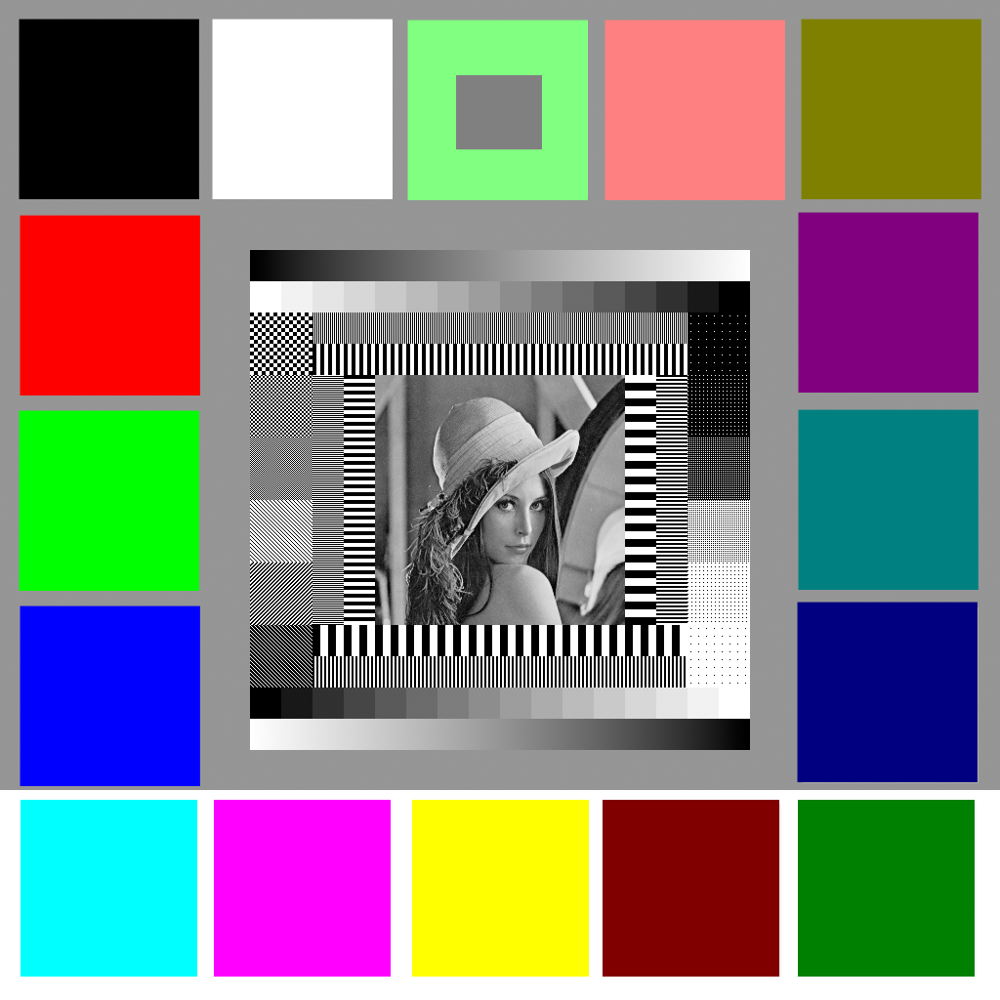

In [51]:
# Caminho do arquivo
caminho = 'F:/Programação/PDI/testpat.1k.color2.tif'

#Abre a imagem
imagem = open_image(caminho)
imagem

## Lendo a máscara de cada filtro

In [52]:
masc_gaussiana = ler_filtro('F:/Programação/PDI/Gaussiano 5x5.txt')
masc_box = ler_filtro('F:/Programação/PDI/Box 1x26.txt')
masc_SH = ler_filtro('F:/Programação/PDI/Sobel horizontal.txt')
masc_SV = ler_filtro('F:/Programação/PDI/Sobel vertical.txt')

## Escolhe o filtro para aplicar na imagem

In [53]:
imagem_filtrada = aplicar_filtro(caminho, masc_gaussiana)

## Filtro de Sobel separado

In [54]:
imagem_Sobel = aplicar_filtro_sobel(caminho, masc_SH)

## Selecionar a imagem utilizando gaus ou box/ Sobel H ou V

In [56]:
# Salvando a imagem resultante
output_path = 'F:/Programação/PDI/testpat.1k.color2_filtrado.tif'
Image.fromarray(imagem_filtrada).save(output_path)